# 1. ENVIRONMENT & LIBRARIES SETUP
Purpose: Load core libraries for data handling, visualization, and neural network modeling with PyTorch.

In [10]:
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter, defaultdict
import os
import random
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torchvision.transforms as transforms
from PIL import Image
import torch.nn.functional as F
import torch
from torchvision import models

In [11]:
print(torch.cuda.is_available())
print(torch.cuda.get_device_name(0))

True
Tesla T4


# 2. DATASET DOWNLOAD & EXTRACTION (Kaggle)
Fetches the Polyvore dataset directly from Kaggle and sets up local paths inside Colab.

In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"lehuynhthuyvy","key":"f22e71132d600da8716738f1a57b6378"}'}

In [ ]:
!mkdir ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d enisteper1/polyvore-outfit-dataset
!unzip -q polyvore-outfit-dataset.zip -d /content/polyvore-outfit-dataset

Dataset URL: https://www.kaggle.com/datasets/enisteper1/polyvore-outfit-dataset
License(s): other
 97% 2.24G/2.30G [00:04<00:00, 562MB/s]
100% 2.30G/2.30G [00:04<00:00, 544MB/s]


# 3. LOAD METADATA & INITIAL EXPLORATION
Purpose: Load item metadata, categories, and outfit structures to understand dataset characteristics and diversity.

251008 items loaded
Categories shape: (194, 3)
   category_id    sub_category main_category
0            3           dress      all-body
1            4           dress      all-body
2            5           dress      all-body
3            6            gown      all-body
4            7           skirt       bottoms
5            8           skirt       bottoms
6            9           skirt       bottoms
7           10      long skirt       bottoms
8           11         sweater          tops
9           11  sleeveless top          tops
33990 training outfits loaded
Outfit size range: 3 - 17
Top 10 item categories:
 shoes: 44850
 jewellery: 41414
 bags: 40717
 tops: 32998
 bottoms: 27670
 all-body: 18478
 outerwear: 17065
 sunglasses: 9874
 accessories: 6973
 hats: 6071


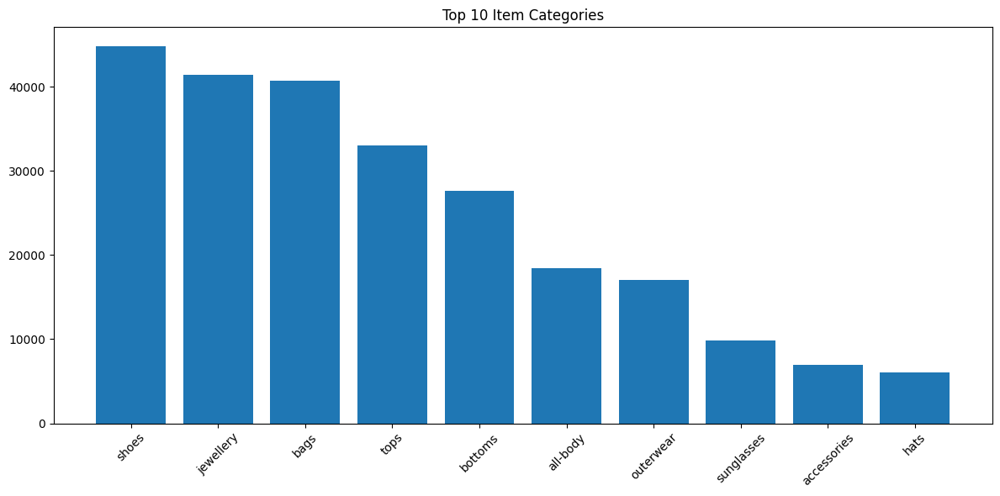

Loaded 16995 outfits from JSON
Images directory: /content/polyvore-outfit-dataset/polyvore_outfits/images
 All dataset paths configured for Colab at: /content/polyvore-outfit-dataset/polyvore_outfits


In [ ]:
# ===== PATH CONFIGURATION =====
DATA_PATH = '/content/polyvore-outfit-dataset/polyvore_outfits'

# File metadata
metadata_path = os.path.join(DATA_PATH, 'polyvore_item_metadata.json')
with open(metadata_path, 'r') as f:
    item_metadata = json.load(f)

print(f"{len(item_metadata)} items loaded")

# ===== Load categories =====
categories_df = pd.read_csv(os.path.join(DATA_PATH, 'categories.csv'))
print(f"Categories shape: {categories_df.shape}")
print(categories_df.head(10))

# ===== Load compatibility training data =====
outfits = []
train_txt_path = os.path.join(DATA_PATH, 'disjoint', 'compatibility_train.txt')
with open(train_txt_path, 'r') as f:
    for line in f:
        items = line.strip().split()
        outfits.append(items)

print(f"{len(outfits)} training outfits loaded")

# ===== Check outfit sizes =====
outfit_sizes = [len(outfit) for outfit in outfits]
print(f"Outfit size range: {min(outfit_sizes)} - {max(outfit_sizes)}")

# ===== Category distribution =====
categories = [item.get('semantic_category', 'Unknown') for item in item_metadata.values()]
category_counts = Counter(categories)
print("Top 10 item categories:")
for category, count in category_counts.most_common(10):
    print(f" {category}: {count}")

plt.figure(figsize=(12, 6))
top_cats = dict(category_counts.most_common(10))
plt.bar(range(len(top_cats)), list(top_cats.values()))
plt.xticks(range(len(top_cats)), list(top_cats.keys()), rotation=45)
plt.title('Top 10 Item Categories')
plt.tight_layout()
plt.show()

# ===== Load JSON training file =====
train_json_path = os.path.join(DATA_PATH, 'disjoint', 'train.json')
with open(train_json_path, 'r') as f:
    train_outfits_json = json.load(f)

print(f"Loaded {len(train_outfits_json)} outfits from JSON")

# ===== IMAGE PATH =====
IMAGES_DIR = os.path.join(DATA_PATH, 'images')
print(f"Images directory: {IMAGES_DIR}")

# ===== Dataset paths in Colab =====
print(f" All dataset paths configured for Colab at: {DATA_PATH}")

In [ ]:
# Check what the actual item IDs look like in metadata
print("Sample item IDs from metadata:")
sample_ids = list(item_metadata.keys())[:10]
for i, item_id in enumerate(sample_ids):
    print(f"  {i+1}. '{item_id}'")

print(f"Sample outfit item IDs: {outfits[0][:5]}")
print(f"Sample metadata item IDs: {sample_ids[:5]}")

Sample item IDs from metadata:
  1. '211990161'
  2. '183179503'
  3. '152771755'
  4. '190445143'
  5. '211444470'
  6. '192704091'
  7. '117334561'
  8. '127403908'
  9. '149817672'
  10. '210309753'
Sample outfit item IDs: ['1', '199244701_1', '199244701_2', '199244701_3', '199244701_4']
Sample metadata item IDs: ['211990161', '183179503', '152771755', '190445143', '211444470']


Found 16995 merged outfits.


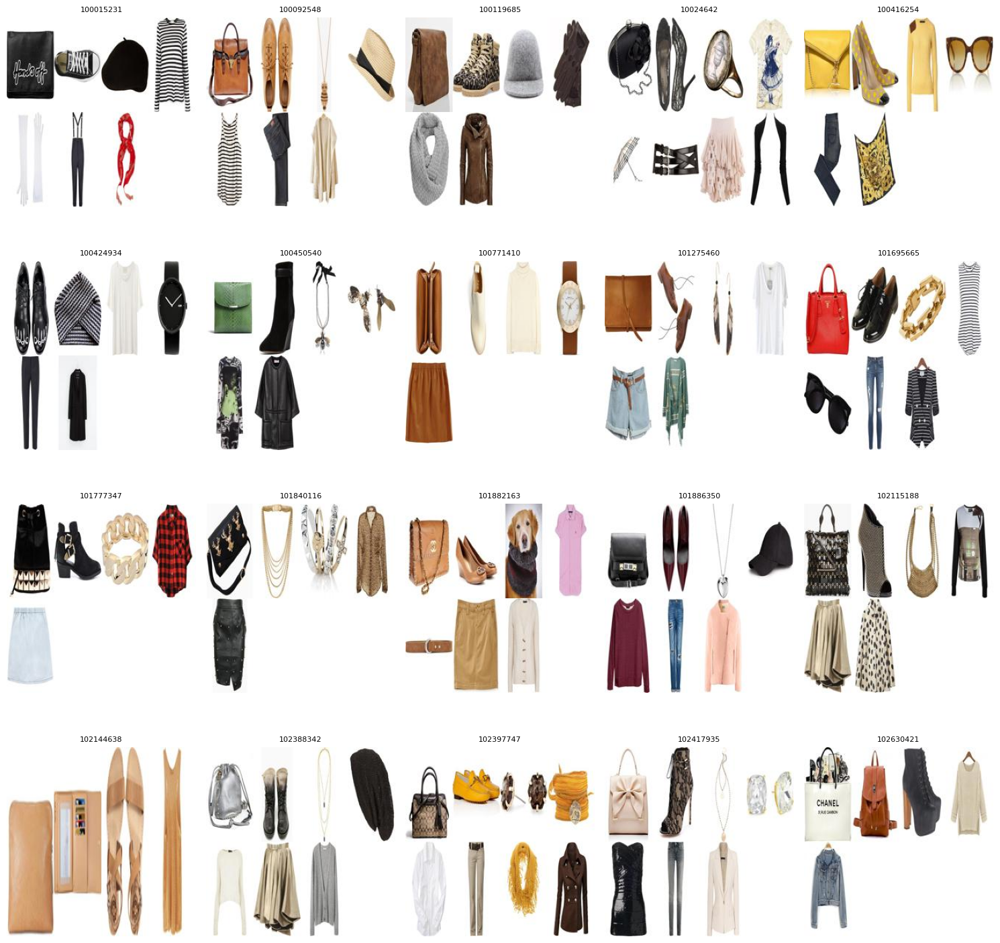

# 4. Data Preparation

Một cặp (Outfit X, Item Y) được coi là Tích cực nếu:
- Item Y chưa có trong Outfit X.
- Item Y không trùng loại (category) với bất kỳ món đồ nào trong Outfit X.
- Item Y có lịch sử được dùng chung với ít nhất 2 món đồ khác trong Outfit X.

In [ ]:
import os, json
from PIL import Image
from collections import defaultdict
from joblib import Parallel, delayed
import multiprocessing
from tqdm import tqdm

# ===== PATH CONFIG =====
DATA_PATH = '/content/polyvore-outfit-dataset/polyvore_outfits'
IMAGES_DIR = os.path.join(DATA_PATH, 'images')
TRAIN_JSON_PATH = os.path.join(DATA_PATH, 'disjoint', 'train.json')
MERGED_DIR = os.path.join(DATA_PATH, 'merged_outfits_3items')
os.makedirs(MERGED_DIR, exist_ok=True)

# ===== Load JSON =====
with open(TRAIN_JSON_PATH, 'r') as f:
    train_data = json.load(f)
print(f"Loaded {len(train_data)} outfits.")

# ===== CONFIG =====
ITEM_SIZE = (128,128)
ITEMS_PER_ROW = 4
FINAL_SIZE = (256,256)

# ===== 1. Lấy 5000 outfit đầu =====
train_subset = train_data[:5000]

# ===== 2. Merge 3 item đầu của mỗi outfit =====
def merge_outfit_3items(outfit):
    images = []
    subset_items = outfit["items"][:3]  # chỉ 3 item đầu
    for item in subset_items:
        item_id = item["item_id"]
        img_path = os.path.join(IMAGES_DIR, f"{item_id}.jpg")
        if os.path.exists(img_path):
            try:
                img = Image.open(img_path).convert("RGB").resize(ITEM_SIZE)
                images.append(img)
            except:
                continue
    if not images:
        return None
    cols = ITEMS_PER_ROW
    rows = (len(images)+cols-1)//cols
    collage = Image.new("RGB", (ITEM_SIZE[0]*cols, ITEM_SIZE[1]*rows), (255,255,255))
    for i,img in enumerate(images):
        x = (i%cols)*ITEM_SIZE[0]
        y = (i//cols)*ITEM_SIZE[1]
        collage.paste(img,(x,y))
    collage = collage.resize(FINAL_SIZE)
    return collage

# Merge tất cả outfit
done_ids = {f.split('.')[0] for f in os.listdir(MERGED_DIR)}
for outfit in tqdm(train_subset, desc="Merging 3 item outfits"):
    set_id = outfit["set_id"]
    save_path = os.path.join(MERGED_DIR, f"{set_id}.jpg")
    if set_id in done_ids:
        continue
    merged_img = merge_outfit_3items(outfit)
    if merged_img:
        merged_img.save(save_path)

# ===== 3. Chuẩn bị maps để tạo positive pair =====
train_items = set()
item_to_coitems = defaultdict(set)
outfit_id_to_items = {}
outfit_id_to_categories = {}

for outfit in train_subset:
    outfit_id = outfit["set_id"]
    items = [item["item_id"] for item in outfit["items"]]
    cats = set([item_metadata[i].get("semantic_category","Unknown") for i in items])
    outfit_id_to_items[outfit_id] = set(items)
    outfit_id_to_categories[outfit_id] = cats
    for i in items:
        train_items.add(i)
        item_to_coitems[i].update(items)  # tất cả items trong outfit

print(f"Prepared maps for {len(train_items)} items and {len(outfit_id_to_items)} outfits.")

# ===== 4. Tạo positive outfit x item pairs =====
def process_outfit_pairs(outfit):
    outfit_id = outfit["set_id"]
    # chỉ lấy 3 item đầu để check co-occurrence
    subset_items = set([item["item_id"] for item in outfit["items"][:3]])
    subset_cats = set([item_metadata[i].get("semantic_category","Unknown") for i in subset_items])

    pairs = []
    candidates = train_items - subset_items
    for c in candidates:
        c_cat = item_metadata[c].get("semantic_category","Unknown")
        if c_cat in subset_cats or c_cat=="Unknown":
            continue
        if "all-body" in subset_cats and c_cat in ["tops","bottoms"]:
            continue
        # co-occurrence ≥1
        co_count = len(subset_items & item_to_coitems[c])
        if co_count >= 1:
            pairs.append((outfit_id, c, 1))
    return pairs

# Parallel
num_cores = min(multiprocessing.cpu_count(),8)
results = Parallel(n_jobs=num_cores, backend="threading")(
    delayed(process_outfit_pairs)(outfit) for outfit in train_subset
)

# Flatten kết quả
positive_pairs = [p for sublist in results for p in sublist]
print(f"Created {len(positive_pairs)} positive outfit x item pairs (5000 outfits).")


Loaded 16995 outfits.


Merging 3 item outfits: 100%|██████████| 5000/5000 [00:25<00:00, 194.89it/s]


Prepared maps for 23593 items and 5000 outfits.
Created 15174 positive outfit x item pairs (5000 outfits).


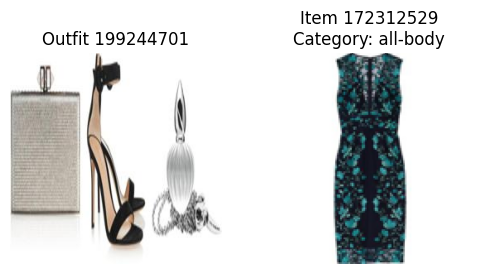

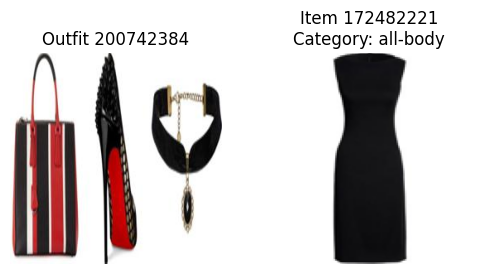

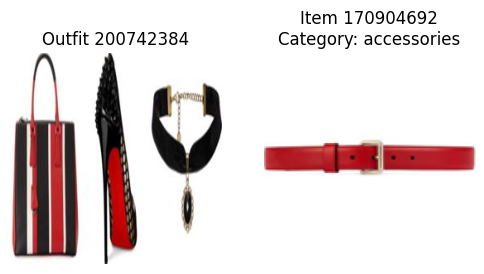

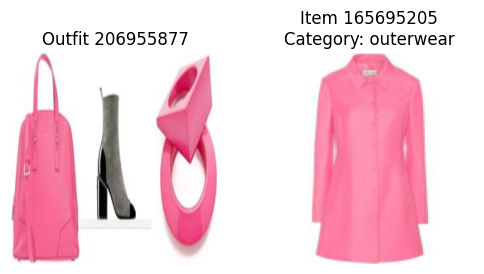

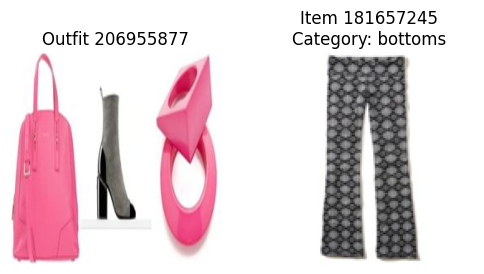

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
import os

# In ra 5 positive pair đầu tiên
num_to_show = 5

for i, (outfit_id, item_id, label) in enumerate(positive_pairs[:num_to_show]):
    outfit_path = os.path.join(MERGED_DIR, f"{outfit_id}.jpg")
    item_path = os.path.join(IMAGES_DIR, f"{item_id}.jpg")

    if not os.path.exists(outfit_path) or not os.path.exists(item_path):
        continue

    outfit_img = Image.open(outfit_path)
    item_img = Image.open(item_path).convert("RGB").resize((128,128))

    # Hiển thị side by side
    fig, axes = plt.subplots(1,2, figsize=(6,3))
    axes[0].imshow(outfit_img)
    axes[0].set_title(f"Outfit {outfit_id}")
    axes[0].axis('off')

    axes[1].imshow(item_img)
    cat = item_metadata[item_id].get("semantic_category","Unknown")
    axes[1].set_title(f"Item {item_id}\nCategory: {cat}")
    axes[1].axis('off')

    plt.show()


Một cặp (Outfit X, Item Y) được coi là Tích cực nếu:
- Candidate item khác category với 3 item đầu của outfit.
→ Tránh ghép những item cùng loại (ví dụ không ghép 2 áo khoác vào cùng outfit).

- Candidate item không nằm trong full outfit gốc.
→ Tránh trường hợp item đã có sẵn trong outfit, vốn đã hợp style.

- Candidate chưa từng co-occur với bất kỳ item nào trong 3 item đầu.
→ Đảm bảo nhãn negative “chặt”, tức item này chưa từng xuất hiện cùng với các item quan trọng trong outfit.

- Rule đặc biệt cho category all-body:
Nếu outfit 3 item đầu chứa all-body, candidate không được là tops hoặc bottoms để tránh phối hợp không hợp logic.

In [ ]:
import random
from joblib import Parallel, delayed
import multiprocessing

# ===== 1. Xác định số lượng negative cần tạo =====
target_negative_pairs = len(positive_pairs) * 5  # 5x positive
num_cores = min(multiprocessing.cpu_count(), 8)

# ===== 2. Hàm tạo negative cho 1 outfit =====
def process_outfit_negative(outfit, n_samples_per_outfit=None):
    outfit_id = outfit["set_id"]
    # full_items: tất cả item trong outfit gốc
    full_items = set([item["item_id"] for item in outfit["items"]])
    # subset_items: chỉ 3 item đầu
    subset_items = set([item["item_id"] for item in outfit["items"][:3]])
    subset_cats = set([item_metadata[i].get("semantic_category","Unknown") for i in subset_items])

    # Candidate items: train_items trong subset nhưng không thuộc full outfit
    candidates = train_items - full_items
    neg_candidates = []

    for c in candidates:
        c_cat = item_metadata[c].get("semantic_category","Unknown")
        # loại nếu cùng category với 3 item đầu hoặc category unknown
        if c_cat in subset_cats or c_cat=="Unknown":
            continue
        # rule all-body
        if "all-body" in subset_cats and c_cat in ["tops","bottoms"]:
            continue
        # rule co-occurrence = 0 với 3 item đầu
        co_count = len(subset_items & item_to_coitems[c])
        if co_count == 0:
            neg_candidates.append(c)

    # Sample ngẫu nhiên nếu có quá nhiều candidate
    if n_samples_per_outfit is not None and len(neg_candidates) > n_samples_per_outfit:
        neg_candidates = random.sample(neg_candidates, n_samples_per_outfit)

    # Trả về list (outfit_id, candidate_item, label=0)
    return [(outfit_id, c, 0) for c in neg_candidates]

# ===== 3. Tính số sample mỗi outfit =====
n_per_outfit = target_negative_pairs // len(train_subset)

# ===== 4. Parallel processing =====
neg_results = Parallel(n_jobs=num_cores, backend="threading")(
    delayed(process_outfit_negative)(outfit, n_samples_per_outfit=n_per_outfit) for outfit in train_subset
)

# Flatten kết quả
negative_pairs = [p for sublist in neg_results for p in sublist]

print(f"Created {len(negative_pairs)} negative outfit x item pairs (~5x positive).")

Created 75000 negative outfit x item pairs (~5x positive).


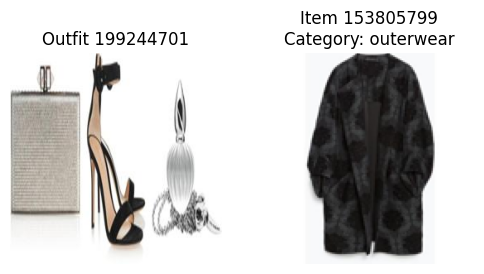

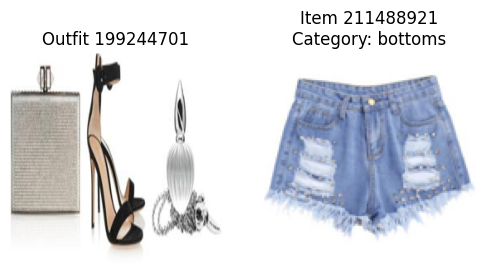

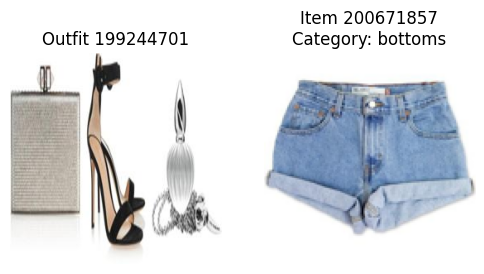

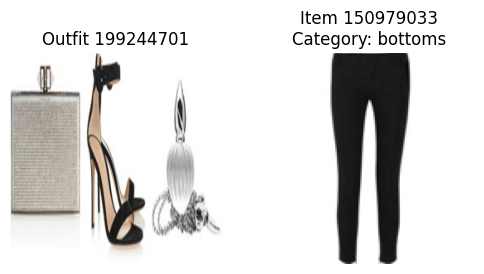

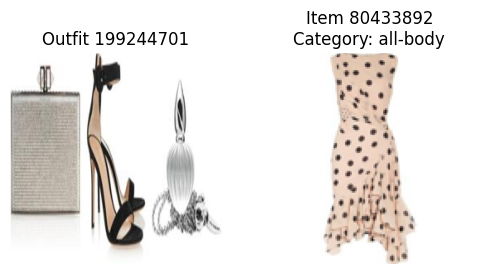

...

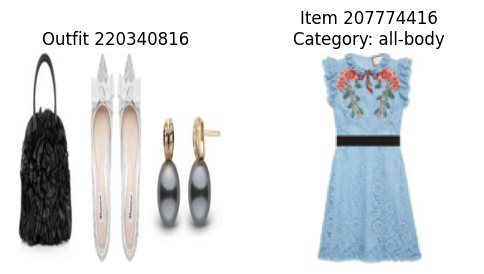

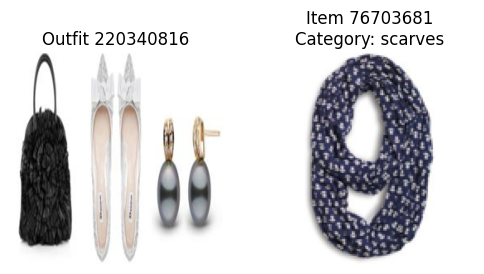

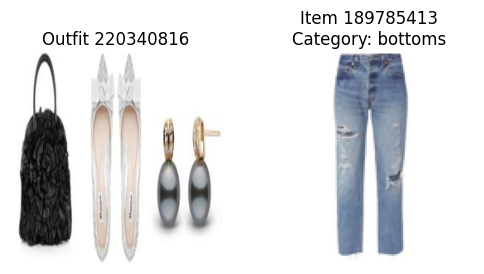

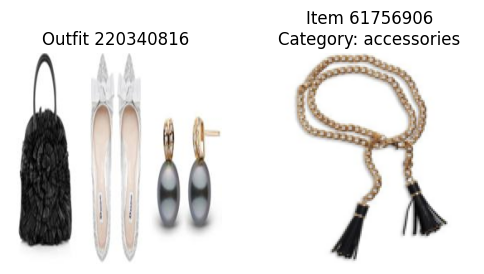

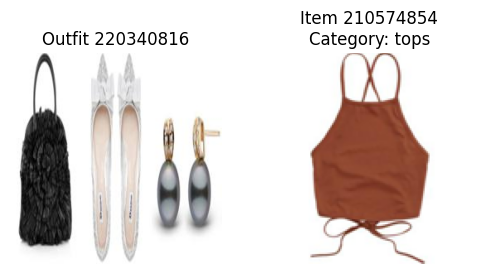

In [ ]:
# Hiển thị 5 negative pair đầu tiên
num_to_show = 50

for i, (outfit_id, item_id, label) in enumerate(negative_pairs[:num_to_show]):
    outfit_path = os.path.join(MERGED_DIR, f"{outfit_id}.jpg")
    item_path = os.path.join(IMAGES_DIR, f"{item_id}.jpg")

    if not os.path.exists(outfit_path) or not os.path.exists(item_path):
        continue

    outfit_img = Image.open(outfit_path)
    item_img = Image.open(item_path).convert("RGB").resize((128,128))

    # Hiển thị side by side
    fig, axes = plt.subplots(1,2, figsize=(6,3))
    axes[0].imshow(outfit_img)
    axes[0].set_title(f"Outfit {outfit_id}")
    axes[0].axis('off')

    axes[1].imshow(item_img)
    cat = item_metadata[item_id].get("semantic_category","Unknown")
    axes[1].set_title(f"Item {item_id}\nCategory: {cat}")
    axes[1].axis('off')

    plt.show()


Tạo dataset all pairs

In [ ]:
import pandas as pd
import random

# ===== 1. Kết hợp positive và negative pairs =====
all_pairs = positive_pairs + negative_pairs
random.shuffle(all_pairs)  # xáo trộn ngẫu nhiên

# ===== 2. Chuyển sang DataFrame để dễ xử lý =====
df_pairs = pd.DataFrame(all_pairs, columns=["outfit_id", "item_id", "label"])

# ===== 3. In ra summary dataset =====
print("==== Dataset Summary ====")
print(f"Tổng số pair: {len(df_pairs)}")
print(f"Số positive: {df_pairs['label'].sum()}")
print(f"Số negative: {len(df_pairs) - df_pairs['label'].sum()}")
print(f"Số outfit unique: {df_pairs['outfit_id'].nunique()}")
print(f"Số item unique: {df_pairs['item_id'].nunique()}")

# ===== 4. Kiểm tra 5 dòng đầu =====
print("\nSample 5 pair:")
print(df_pairs.head())


==== Dataset Summary ====
Tổng số pair: 90174
Số positive: 15174
Số negative: 75000
Số outfit unique: 5000
Số item unique: 18698

Sample 5 pair:
   outfit_id    item_id  label
0  191985100  144171088      0
1  220175956  132014513      0
2  168413735  140885049      1
3  214494287  134335671      1
4  209492400  212838708      0


# 5. Train/Val split

In [ ]:
import os
import pandas as pd
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image

# ===== PATH =====
DATA_PATH = '/content/polyvore-outfit-dataset/polyvore_outfits'
IMAGES_DIR_ITEMS = os.path.join(DATA_PATH, 'images')
IMAGES_DIR_OUTFITS = os.path.join(DATA_PATH, 'merged_outfits_3items')
CSV_PATH = '/content/all_pairs_dataset.csv'

# Load CSV all pairs
df_pairs = pd.read_csv(CSV_PATH)
print(f"Loaded {len(df_pairs)} total pairs from CSV")
print(df_pairs.head())

# ===== Split train/val =====
train_size = int(0.8 * len(df_pairs))
train_df = df_pairs.iloc[:train_size]
val_df = df_pairs.iloc[train_size:]

# ===== Transforms =====
train_transform = transforms.Compose([
    transforms.Resize((128,128)),
    transforms.RandomHorizontalFlip(0.5),
    transforms.ColorJitter(0.2,0.2,0.2),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])

val_transform = transforms.Compose([
    transforms.Resize((128,128)),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])

# ===== Dataset =====
class OutfitItemDataset(Dataset):
    def __init__(self, df, images_dir_items, images_dir_outfits, transform=None):
        self.df = df
        self.images_dir_items = images_dir_items
        self.images_dir_outfits = images_dir_outfits
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        outfit_id = row['outfit_id']
        item_id = row['item_id']
        label = row['label']

        # Load outfit image (3 item merge)
        outfit_path = os.path.join(self.images_dir_outfits, f"{outfit_id}.jpg")
        outfit_img = Image.open(outfit_path).convert("RGB")

        # Load item image
        item_path = os.path.join(self.images_dir_items, f"{item_id}.jpg")
        item_img = Image.open(item_path).convert("RGB")

        if self.transform:
            outfit_img = self.transform(outfit_img)
            item_img = self.transform(item_img)

        return outfit_img, item_img, label

# ===== Dataloaders =====
train_dataset = OutfitItemDataset(train_df, IMAGES_DIR_ITEMS, IMAGES_DIR_OUTFITS, transform=train_transform)
val_dataset = OutfitItemDataset(val_df, IMAGES_DIR_ITEMS, IMAGES_DIR_OUTFITS, transform=val_transform)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=8, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False, num_workers=8, pin_memory=True)

print(f"Train loader batches: {len(train_loader)}")
print(f"Validation loader batches: {len(val_loader)}")


Loaded 90174 total pairs from CSV
   outfit_id    item_id  label
0  191985100  144171088      0
1  220175956  132014513      0
2  168413735  140885049      1
3  214494287  134335671      1
4  209492400  212838708      0
Train loader batches: 1128
Validation loader batches: 282


In [ ]:
print(f"Số lượng train pairs: {len(train_df)}")
print(f"Số lượng validation pairs: {len(val_df)}")


Số lượng train pairs: 72139
Số lượng validation pairs: 18035


# 6. Model Architecture

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
from torch.utils.data import DataLoader
import torch.optim as optim

# -----------------------------
# Contrastive Loss
# -----------------------------
class ContrastiveLoss(nn.Module):
    """
    Contrastive loss cho Siamese network
    label: 1 nếu similar, 0 nếu dissimilar
    """
    def __init__(self, margin=1.0):
        super(ContrastiveLoss, self).__init__()
        self.margin = margin

    def forward(self, output1, output2, label):
        euclidean_distance = F.pairwise_distance(output1, output2)
        loss = torch.mean(
            label * torch.pow(euclidean_distance, 2) +
            (1 - label) * torch.pow(torch.clamp(self.margin - euclidean_distance, min=0.0), 2)
        )
        return loss

# -----------------------------
# Siamese Network với ResNet50
# -----------------------------
class SiameseNetworkResNet50(nn.Module):
    def __init__(self, embedding_dim=512, dropout=0.3):
        super(SiameseNetworkResNet50, self).__init__()

        # Backbone ResNet50 pretrained
        self.backbone = models.resnet50(pretrained=True)
        self.feature_extractor = nn.Sequential(*list(self.backbone.children())[:-1])  # remove FC

        # Freeze early layers (optional)
        for param in list(self.feature_extractor.parameters())[:6]:
            param.requires_grad = False

        # Embedding layers
        self.embedding = nn.Sequential(
            nn.Flatten(),          # [batch, 2048,1,1] -> [batch,2048]
            nn.Linear(2048, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout),
            nn.Linear(512, embedding_dim),
            nn.BatchNorm1d(embedding_dim)
        )

        # Compatibility classifier
        self.classifier = nn.Sequential(
            nn.Linear(embedding_dim * 2, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout),
            nn.Linear(256, 64),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout / 2),
            nn.Linear(64, 1),
            nn.Sigmoid()
        )

    def forward_once(self, x):
        features = self.feature_extractor(x)
        embedding = self.embedding(features)
        embedding = F.normalize(embedding, p=2, dim=1)
        return embedding

    def forward(self, img1, img2):
        emb1 = self.forward_once(img1)
        emb2 = self.forward_once(img2)
        combined = torch.cat([emb1, emb2], dim=1)
        compat = self.classifier(combined)
        return compat, emb1, emb2

# -----------------------------
# Device
# -----------------------------
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Instantiate model
model = SiameseNetworkResNet50(embedding_dim=512).to(device)

# Losses
contrastive_loss = ContrastiveLoss(margin=1.0)
bce_loss = nn.BCELoss()

# Optimizer và scheduler
optimizer = optim.Adam([
    {'params': model.feature_extractor.parameters(), 'lr': 1e-4},
    {'params': model.embedding.parameters(), 'lr': 1e-3},
    {'params': model.classifier.parameters(), 'lr': 1e-3}
], weight_decay=1e-5)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=2)



Using device: cuda


# 7.LOOP

In [ ]:
num_epochs = 5
best_val_acc = 0.0
train_losses = []
val_accuracies = []

for epoch in range(num_epochs):
    print(f"\n=== Epoch {epoch+1}/{num_epochs} ===")

    # -------------------
    # Training phase
    # -------------------
    model.train()
    running_loss = 0.0
    train_correct = 0
    train_total = 0

    for batch_idx, batch in enumerate(train_loader):
        img1 = batch[0].to(device)
        img2 = batch[1].to(device)
        labels = batch[2].to(device).float()

        optimizer.zero_grad()
        compat, emb1, emb2 = model(img1, img2)

        # Loss
        loss1 = contrastive_loss(emb1, emb2, labels)
        loss2 = bce_loss(compat.view(-1), labels)
        loss = 0.1 * loss1 + loss2

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()

        running_loss += loss.item()
        predicted = (compat.view(-1) > 0.5).float()
        train_total += labels.size(0)
        train_correct += (predicted == labels).sum().item()

        if batch_idx % 100 == 0:
            print(f"Batch {batch_idx}/{len(train_loader)} - Loss: {loss.item():.4f}, "
                  f"Acc: {train_correct/train_total:.4f}")

    avg_train_loss = running_loss / len(train_loader)
    train_acc = train_correct / train_total
    train_losses.append(avg_train_loss)

    # -------------------
    # Validation phase
    # -------------------
    model.eval()
    val_correct = 0
    val_total = 0
    val_loss = 0.0

    with torch.no_grad():
        for batch_idx, batch in enumerate(val_loader):
            img1 = batch[0].to(device)
            img2 = batch[1].to(device)
            labels = batch[2].to(device).float()

            compat, emb1, emb2 = model(img1, img2)

            loss1 = contrastive_loss(emb1, emb2, labels)
            loss2 = bce_loss(compat.view(-1), labels)
            loss = 0.1 * loss1 + loss2
            val_loss += loss.item()

            predicted = (compat.view(-1) > 0.5).float()
            val_total += labels.size(0)
            val_correct += (predicted == labels).sum().item()

    avg_val_loss = val_loss / len(val_loader)
    val_acc = val_correct / val_total
    val_accuracies.append(val_acc)

    print(f"Epoch {epoch+1} summary: Train Loss={avg_train_loss:.4f}, Train Acc={train_acc:.4f}, "
          f"Val Loss={avg_val_loss:.4f}, Val Acc={val_acc:.4f}")

    # Scheduler step
    scheduler.step(val_acc)

    # Save checkpoint mỗi epoch
    checkpoint_path = f"siamese_resnet50_epoch{epoch+1}.pth"
    torch.save({
        'epoch': epoch+1,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'train_loss': avg_train_loss,
        'val_loss': avg_val_loss,
        'val_acc': val_acc
    }, checkpoint_path)
    print(f"  Checkpoint saved: {checkpoint_path}")

    # Save best model
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(), 'siamese_model_resnet50_best.pth')
        print(f"  Best model updated! Val Acc={best_val_acc:.4f}")

print(f"\nTraining completed! Best validation accuracy: {best_val_acc:.4f}")



=== Epoch 1/5 ===
Batch 0/1128 - Loss: 0.6155, Acc: 0.7500
Batch 100/1128 - Loss: 0.4708, Acc: 0.8263
Batch 200/1128 - Loss: 0.6042, Acc: 0.8248
Batch 300/1128 - Loss: 0.4713, Acc: 0.8304
Batch 400/1128 - Loss: 0.5746, Acc: 0.8295
Batch 500/1128 - Loss: 0.5016, Acc: 0.8311
Batch 600/1128 - Loss: 0.3134, Acc: 0.8315
Batch 700/1128 - Loss: 0.4697, Acc: 0.8318
Batch 800/1128 - Loss: 0.3443, Acc: 0.8311
Batch 900/1128 - Loss: 0.3996, Acc: 0.8314
Batch 1000/1128 - Loss: 0.3756, Acc: 0.8318
Batch 1100/1128 - Loss: 0.4448, Acc: 0.8322
Epoch 1 summary: Train Loss=0.4683, Train Acc=0.8320, Val Loss=0.4537, Val Acc=0.8307
  Checkpoint saved: siamese_resnet50_epoch1.pth
  Best model updated! Val Acc=0.8307

=== Epoch 2/5 ===
Batch 0/1128 - Loss: 0.5355, Acc: 0.7969
Batch 100/1128 - Loss: 0.4677, Acc: 0.8246
Batch 200/1128 - Loss: 0.3549, Acc: 0.8276
Batch 300/1128 - Loss: 0.4163, Acc: 0.8281
Batch 400/1128 - Loss: 0.5077, Acc: 0.8309
Batch 500/1128 - Loss: 0.3823, Acc: 0.8312
Batch 600/1128 - Lo

- Loss giảm: từ ~0.468 → 0.420, nghĩa là model dự đoán tốt hơn, lỗi trung bình giảm.
- Train/Val Acc tăng: từ ~0.832 → 0.837, nghĩa là tỷ lệ dự đoán đúng tăng, model học được cách phân biệt cặp outfit-item tương thích.

# 8. Encode data chưa nhìn

In [ ]:
import os
import json
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, transforms
from tqdm import tqdm

# -----------------------------
# Config
# -----------------------------
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
checkpoint_path = '/content/siamese_resnet50_epoch5.pth'
image_root = '/content/polyvore-outfit-dataset/polyvore_outfits/images'
json_path = '/content/polyvore-outfit-dataset/polyvore_outfits/disjoint/valid.json'
embedding_dim = 512

# -----------------------------
# Model definition (embedding only)
# -----------------------------
class SiameseResNet50Encoder(nn.Module):
    def __init__(self, embedding_dim=512):
        super().__init__()
        self.backbone = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
        self.feature_extractor = nn.Sequential(*list(self.backbone.children())[:-1])  # [batch,2048,1,1]
        self.embedding = nn.Sequential(
            nn.Flatten(),
            nn.Linear(2048, embedding_dim),
            nn.BatchNorm1d(embedding_dim)
        )

    def forward_once(self, x):
        features = self.feature_extractor(x)
        embedding = self.embedding(features)
        embedding = F.normalize(embedding, p=2, dim=1)
        return embedding

# -----------------------------
# Load model checkpoint (partial)
# -----------------------------
model = SiameseResNet50Encoder(embedding_dim=embedding_dim).to(device)
checkpoint = torch.load(checkpoint_path, map_location=device)
state_dict = checkpoint['model_state_dict']

# Remove classifier keys (if any)
state_dict = {k: v for k, v in state_dict.items() if 'classifier' not in k}
model.load_state_dict(state_dict, strict=False)
model.eval()
print("Model loaded! Ready to encode.")

# -----------------------------
# Image preprocessing
# -----------------------------
transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225])
])

# -----------------------------
# Load validation JSON
# -----------------------------
with open(json_path, 'r') as f:
    val_data = json.load(f)

# Collect unique item_ids
item_ids = set()
for outfit in val_data:
    for item in outfit['items']:
        item_ids.add(item['item_id'])

print(f"Total unique validation items: {len(item_ids)}")

# -----------------------------
# Encode images
# -----------------------------
embeddings = {}
for item_id in tqdm(item_ids, desc="Encoding images"):
    img_path = os.path.join(image_root, f"{item_id}.jpg")
    if not os.path.exists(img_path):
        print(f"Warning: image {img_path} not found!")
        continue
    img = Image.open(img_path).convert('RGB')
    img_tensor = transform(img).unsqueeze(0).to(device)  # [1,3,224,224]

    with torch.no_grad():
        emb = model.forward_once(img_tensor)
        embeddings[item_id] = emb.cpu().squeeze(0)  # [512]

print(f"Encoded {len(embeddings)} items.")

# -----------------------------
# Save embeddings
# -----------------------------
torch.save(embeddings, 'val_item_embeddings_512.pt')
print("Embeddings saved to val_item_embeddings_512.pt")


Model loaded! Ready to encode.
Total unique validation items: 14657


Encoding images: 100%|██████████| 14657/14657 [02:06<00:00, 115.63it/s]


Encoded 14657 items.
Embeddings saved to val_item_embeddings_512.pt


Loaded 14657 embeddings.


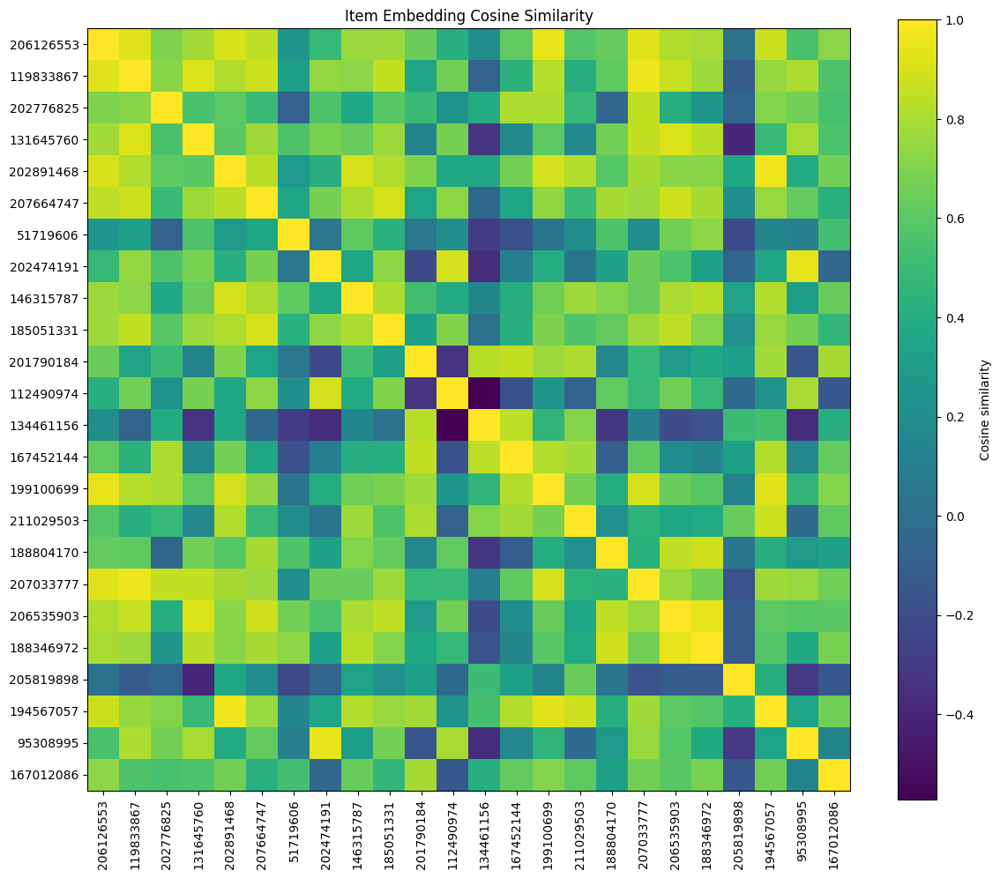

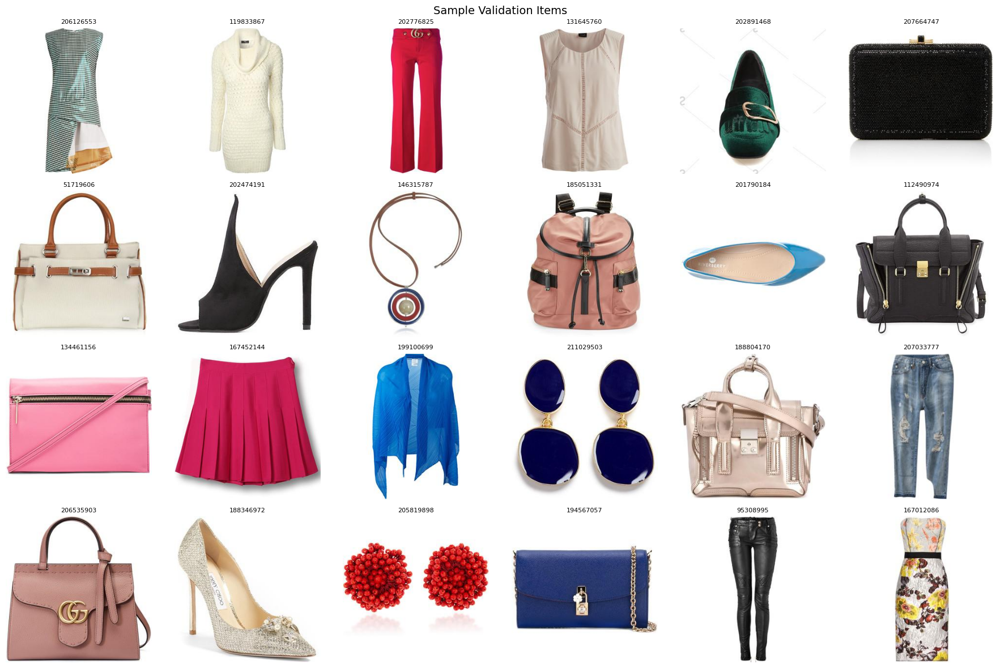

In [ ]:
import torch
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
from PIL import Image
import random
import os

# -----------------------------
# Load embeddings
# -----------------------------
embeddings = torch.load('val_item_embeddings_512.pt')
print(f"Loaded {len(embeddings)} embeddings.")

# -----------------------------
# Sample a larger subset
# -----------------------------
num_samples = min(24, len(embeddings))  # ví dụ lấy 24 item
sample_item_ids = random.sample(list(embeddings.keys()), num_samples)
sample_embeddings = torch.stack([embeddings[i] for i in sample_item_ids]).numpy()  # [N,512]

# -----------------------------
# Cosine similarity matrix
# -----------------------------
sim_matrix = cosine_similarity(sample_embeddings)  # [N,N]

# -----------------------------
# Plot similarity heatmap
# -----------------------------
plt.figure(figsize=(12,10))
plt.imshow(sim_matrix, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Cosine similarity')
plt.xticks(range(num_samples), sample_item_ids, rotation=90)
plt.yticks(range(num_samples), sample_item_ids)
plt.title('Item Embedding Cosine Similarity')
plt.tight_layout()
plt.show()

# -----------------------------
# Plot images in grid
# -----------------------------
num_cols = 6
num_rows = int(np.ceil(num_samples/num_cols))
plt.figure(figsize=(num_cols*3, num_rows*3))

for idx, item_id in enumerate(sample_item_ids):
    img_path = f"/content/polyvore-outfit-dataset/polyvore_outfits/images/{item_id}.jpg"
    plt.subplot(num_rows, num_cols, idx+1)
    if os.path.exists(img_path):
        img = Image.open(img_path).convert('RGB')
        plt.imshow(img)
        plt.title(item_id, fontsize=8)
        plt.axis('off')
    else:
        plt.text(0.5,0.5,"Image not found", ha='center', va='center')
        plt.axis('off')

plt.suptitle('Sample Validation Items', fontsize=14)
plt.tight_layout()
plt.show()


Loaded 14657 embeddings.


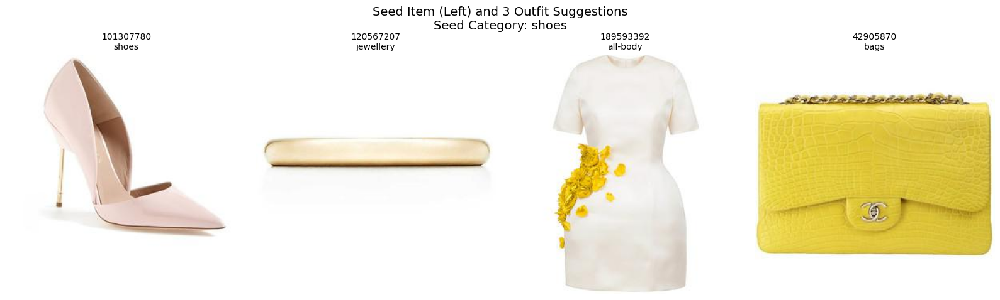


Seed Item:
ID: 101307780, Category: shoes, Title: Kurt Geiger London 'Bond' d'Orsay Pump, Description: A metallic cigarette heel heightens the fierce femininity of a razor-sharp d'Orsay pump crafted in pale pink patent leather. Color(s): pale pink. Brand: Kurt Geiger London. Style Name: Kurt Geiger London 'Bond' d'Orsay Pump. Style Number: 398082.

Suggested Items:
1. ID: 120567207, Category: jewellery, Title: , Description: 
2. ID: 189593392, Category: all-body, Title: , Description: 
3. ID: 42905870, Category: bags, Title: , Description: 




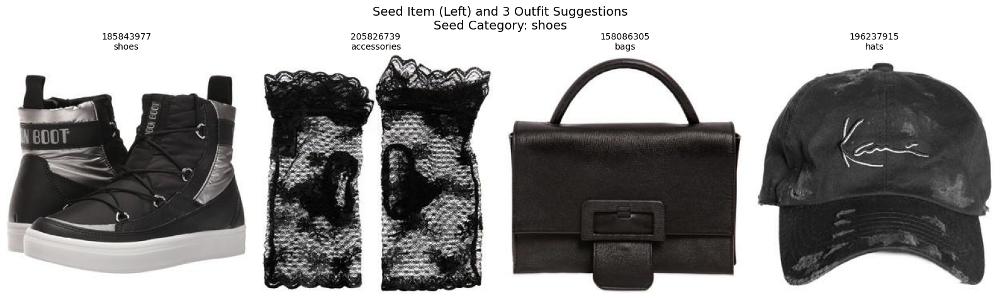


Seed Item:
ID: 185843977, Category: shoes, Title: , Description: 

Suggested Items:
1. ID: 205826739, Category: accessories, Title: , Description: 
2. ID: 158086305, Category: bags, Title: , Description: 
3. ID: 196237915, Category: hats, Title: , Description: 




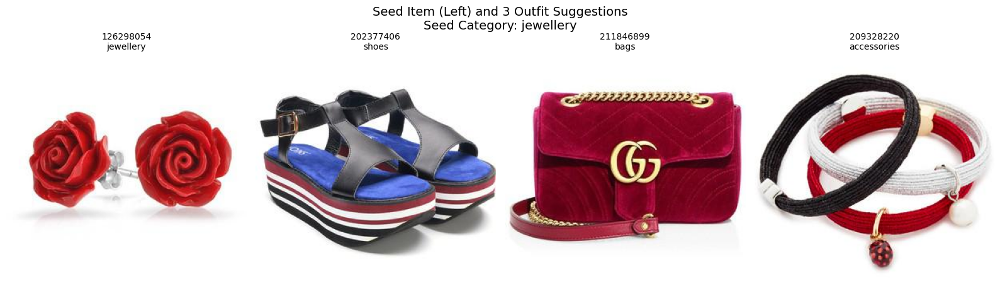


Seed Item:
ID: 126298054, Category: jewellery, Title: , Description: 

Suggested Items:
1. ID: 202377406, Category: shoes, Title: , Description: 
2. ID: 211846899, Category: bags, Title: , Description: 
3. ID: 209328220, Category: accessories, Title: , Description: 




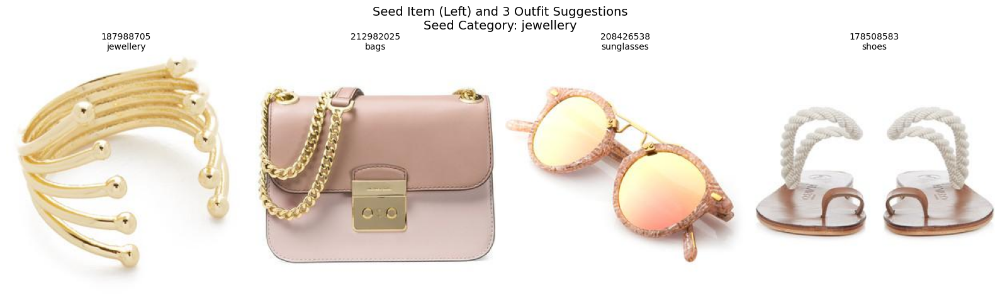


Seed Item:
ID: 187988705, Category: jewellery, Title: , Description: 

Suggested Items:
1. ID: 212982025, Category: bags, Title: , Description: 
2. ID: 208426538, Category: sunglasses, Title: , Description: 
3. ID: 178508583, Category: shoes, Title: Álvaro Angela rope and leather sandals, Description: These tan-brown smooth-leather Angela sandals are an Álvaro signature.  They're handmade in Italy and fasten with a small toe strap, and distinctive cream rope that crosses diagonally over the foot.  Wear them to lend your look an effortlessly elevated finish.




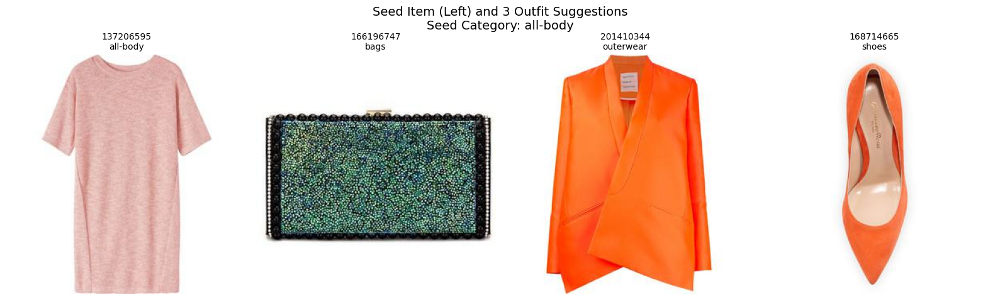


Seed Item:
ID: 137206595, Category: all-body, Title: , Description: 

Suggested Items:
1. ID: 166196747, Category: bags, Title: , Description: 
2. ID: 201410344, Category: outerwear, Title: , Description: 
3. ID: 168714665, Category: shoes, Title: Gianvito Rossi Suede Pointed-Toe 105mm Pump, Orange, Description: Shop Suede Pointed-Toe 105mm Pump, Orange from Gianvito Rossi at Neiman Marcus, where you'll find free shipping on the latest in fashion from top designers.




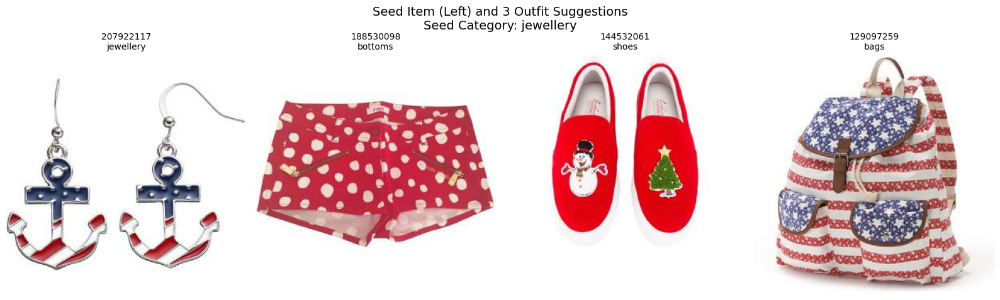


Seed Item:
ID: 207922117, Category: jewellery, Title: , Description: 

Suggested Items:
1. ID: 188530098, Category: bottoms, Title: , Description: 
2. ID: 144532061, Category: shoes, Title: Joshua Sanders Christmas Motif Slip on Sneakers, Description: Red wool christmas motif slip on sneakers from Joshua Sanders.
3. ID: 129097259, Category: bags, Title: , Description: 




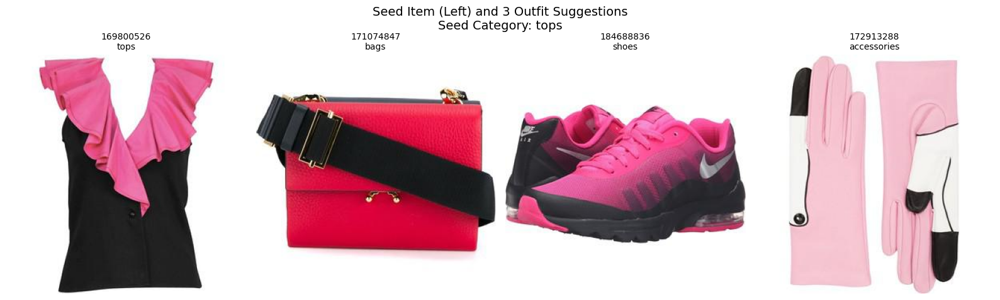


Seed Item:
ID: 169800526, Category: tops, Title: Preowned 1980's Yves Saint Laurent Ysl Black Sleeveless Top With Ruffles, Description: 1980's Yves Saint Laurent Black Sleeveless Fitted Top With Ruffles. Black Cotton Vest Top Has Vibrant Double Layered Pink Ruffles Cascading To The Middle Of Bodice. Excellent Condition. Fits Like A Us Size 2-4.

Suggested Items:
1. ID: 171074847, Category: bags, Title: , Description: 
2. ID: 184688836, Category: shoes, Title: Nike Air Max Invigor Print (Black/Pink Foil/Sport Fuchsia/Metallic Sil..., Description: This brand is a member of the Sustainable Apparel Coalition. Run like the wind with the Nike Air Max Invigor Print. Breathable-mesh upper. Lace-up closure with secure fit. Padded tongue and collar. Signature Nike Swoosh logo. Heel pull tab. Visible Air Max unit in heel for shock absorption. Rubber toe bumper. Breathable mesh lining and cushioned insole. Synthetic midsole and flex-groove outsole. Imported. Measurements: Weight: 10 oz Product me

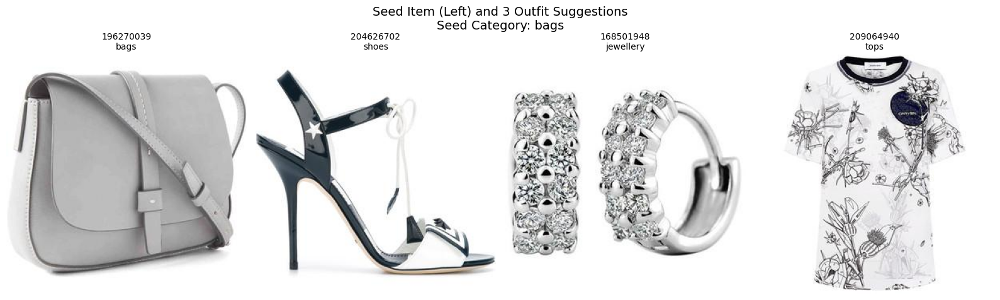


Seed Item:
ID: 196270039, Category: bags, Title: , Description: 

Suggested Items:
1. ID: 204626702, Category: shoes, Title: Dolce & Gabbana Keira Sandals, Description: Dolce Gabbana s Spring/Summer 2017 Marina collection draws inspiration from sailing, with sailor style tattoos and symbols found on sailor s uniforms appearing as distinct patches throughout, whilst traditional Breton stripes provide the colour palette. These fun Keira sandals from the collection will instantly add a nautical touch to your look with their navy and white striped printed insole and marine inspired detailing. Crafted from shiny patent leather and smooth calf leather, they feature an open toe, a branded insole, a tie fastening and a high stiletto heel. Designer colour: Bianco/blu navy.   Made in Italy.   Designer Style ID: CR0293AB724.   Farfetch ID: 11857656
2. ID: 168501948, Category: jewellery, Title: , Description: 
3. ID: 209064940, Category: tops, Title: , Description: 




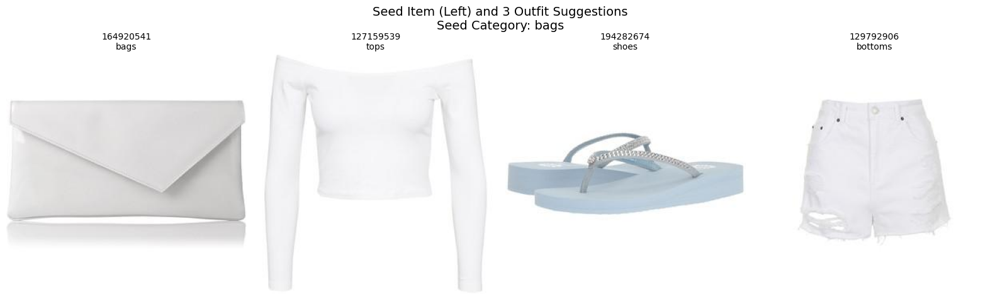


Seed Item:
ID: 164920541, Category: bags, Title: , Description: 

Suggested Items:
1. ID: 127159539, Category: tops, Title: Nly Blush Offshoulder Jersey Top, Description: Cropped top from JEANE BLUSH/NLY BLUSH. Tight, off shoulder design, with long sleeves. Made of 90% Cotton, 5% Viscose and 5% Elastane. The model: Model is 175 cm tall and is wearing a size Small.
2. ID: 194282674, Category: shoes, Title: , Description: 
3. ID: 129792906, Category: bottoms, Title: TOPSHOP MOTO White Ripped Mom Shorts, Description: MOTO white denim Mom shorts with rip detail and cut-off hem.  100% Cotton.  Machine wash.




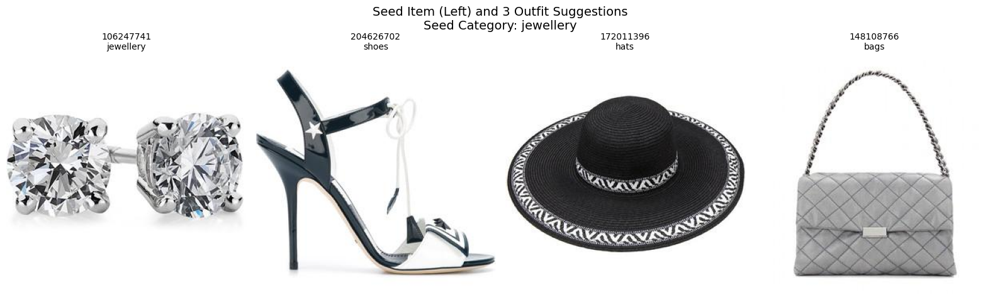


Seed Item:
ID: 106247741, Category: jewellery, Title: , Description: 

Suggested Items:
1. ID: 204626702, Category: shoes, Title: Dolce & Gabbana Keira Sandals, Description: Dolce Gabbana s Spring/Summer 2017 Marina collection draws inspiration from sailing, with sailor style tattoos and symbols found on sailor s uniforms appearing as distinct patches throughout, whilst traditional Breton stripes provide the colour palette. These fun Keira sandals from the collection will instantly add a nautical touch to your look with their navy and white striped printed insole and marine inspired detailing. Crafted from shiny patent leather and smooth calf leather, they feature an open toe, a branded insole, a tie fastening and a high stiletto heel. Designer colour: Bianco/blu navy.   Made in Italy.   Designer Style ID: CR0293AB724.   Farfetch ID: 11857656
2. ID: 172011396, Category: hats, Title: , Description: 
3. ID: 148108766, Category: bags, Title: , Description: 




In [26]:
import torch
import json
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
from PIL import Image
import matplotlib.pyplot as plt
import os
import random

# -----------------------------
# Load embeddings & metadata
# -----------------------------
embeddings = torch.load('/content/val_item_embeddings_512.pt')
print(f"Loaded {len(embeddings)} embeddings.")

with open('/content/polyvore-outfit-dataset/polyvore_outfits/polyvore_item_metadata.json','r') as f:
    metadata = json.load(f)

# -----------------------------
# Helper: get metadata info
# -----------------------------
def get_item_info(item_id):
    item_meta = metadata.get(item_id, {})
    title = item_meta.get('title', '')
    description = item_meta.get('description', '')
    semantic_category = item_meta.get('semantic_category', '')
    return title, description, semantic_category

# -----------------------------
# Function: pick 3 outfit suggestions
# -----------------------------
def pick_outfit(seed_item_id, embeddings, metadata, top_k=3):
    seed_emb = embeddings[seed_item_id].unsqueeze(0).numpy()
    _, _, seed_semantic = get_item_info(seed_item_id)

    candidate_ids = [i for i in embeddings.keys() if i != seed_item_id]
    candidate_embeddings = np.stack([embeddings[i].numpy() for i in candidate_ids])
    sim_scores = cosine_similarity(seed_emb, candidate_embeddings)[0]
    sorted_indices = np.argsort(-sim_scores)

    picked_ids = []
    picked_categories = set([seed_semantic])

    for idx in sorted_indices:
        candidate_id = candidate_ids[idx]
        _, _, sem_cat = get_item_info(candidate_id)
        if sem_cat == '':
            continue

        # ---- all-body vs tops/bottoms logic fix ----
        if 'all-body' in picked_categories and sem_cat in ['tops', 'bottoms']:
            continue  # đã pick all-body → skip tops/bottoms
        if any(c in ['tops', 'bottoms'] for c in picked_categories) and sem_cat == 'all-body':
            continue  # đã pick tops/bottoms → skip all-body

        # tránh trùng category
        if sem_cat in picked_categories:
            continue

        picked_ids.append(candidate_id)
        picked_categories.add(sem_cat)

        if len(picked_ids) == top_k:
            break

    return picked_ids


# -----------------------------
# Pick 5 random seeds and visualize
# -----------------------------
seed_item_ids = random.sample(list(embeddings.keys()), 10)

for seed_item_id in seed_item_ids:
    seed_title, seed_desc, seed_semantic = get_item_info(seed_item_id)
    picked_ids = pick_outfit(seed_item_id, embeddings, metadata, top_k=3)

    all_ids = [seed_item_id] + picked_ids
    num_cols = 4
    plt.figure(figsize=(num_cols*4, 5))

    for idx, item_id in enumerate(all_ids):
        img_path = f"/content/polyvore-outfit-dataset/polyvore_outfits/images/{item_id}.jpg"
        plt.subplot(1,num_cols,idx+1)
        if os.path.exists(img_path):
            img = Image.open(img_path).convert('RGB')
            plt.imshow(img)
            title, desc, sem_cat = get_item_info(item_id)
            plt.title(f"{item_id}\n{sem_cat}", fontsize=10)
        else:
            plt.text(0.5,0.5,"Image not found", ha='center', va='center')
        plt.axis('off')

    plt.suptitle(f'Seed Item (Left) and 3 Outfit Suggestions\nSeed Category: {seed_semantic}', fontsize=14)
    plt.tight_layout()
    plt.show()

    # Print metadata details
    print("\nSeed Item:")
    print(f"ID: {seed_item_id}, Category: {seed_semantic}, Title: {seed_title}, Description: {seed_desc}")

    print("\nSuggested Items:")
    for i, item_id in enumerate(picked_ids):
        title, desc, sem_cat = get_item_info(item_id)
        print(f"{i+1}. ID: {item_id}, Category: {sem_cat}, Title: {title}, Description: {desc}")
    print("\n" + "="*80 + "\n")


In [20]:
!pip install faiss-cpu --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 31.4/31.4 MB 89.3 MB/s eta 0:00:00


In [21]:
import torch
import json
import numpy as np
import faiss
from tqdm import tqdm

# -----------------------------
# Load embeddings & metadata
# -----------------------------
embeddings = torch.load('/content/val_item_embeddings_512.pt')
print(f"Loaded {len(embeddings)} embeddings.")

with open('/content/polyvore-outfit-dataset/polyvore_outfits/polyvore_item_metadata.json','r') as f:
    metadata = json.load(f)

# -----------------------------
# Helper: get metadata info
# -----------------------------
def get_item_info(item_id):
    item_meta = metadata.get(item_id, {})
    title = item_meta.get('title', '')
    description = item_meta.get('description', '')
    semantic_category = item_meta.get('semantic_category', '')
    return title, description, semantic_category

# -----------------------------
# Prepare FAISS index
# -----------------------------
all_ids = list(embeddings.keys())
id_to_index = {item_id: idx for idx, item_id in enumerate(all_ids)}
dim = embeddings[all_ids[0]].shape[0]

all_embs = np.stack([embeddings[i].numpy() for i in all_ids]).astype('float32')
faiss.normalize_L2(all_embs)  # normalize for cosine similarity

index = faiss.IndexFlatIP(dim)  # inner product = cosine similarity on normalized vectors
index.add(all_embs)

print(f"FAISS index created with {len(all_ids)} vectors.")

# -----------------------------
# Function: pick top-k with FAISS
# -----------------------------
def pick_outfit_faiss(seed_idx, top_k=3, search_k=50):
    seed_item_id = all_ids[seed_idx]
    seed_emb = all_embs[seed_idx:seed_idx+1]

    # search top search_k nearest neighbors
    D, I = index.search(seed_emb, search_k)
    candidate_indices = I[0]
    picked_ids = []
    _, _, seed_semantic = get_item_info(seed_item_id)
    picked_categories = set([seed_semantic])

    for idx in candidate_indices:
        candidate_id = all_ids[idx]
        if candidate_id == seed_item_id:
            continue
        _, _, sem_cat = get_item_info(candidate_id)
        if sem_cat == '':
            continue

        # ---- all-body vs tops/bottoms logic ----
        if 'all-body' in picked_categories and sem_cat in ['tops', 'bottoms']:
            continue
        if any(c in ['tops', 'bottoms'] for c in picked_categories) and sem_cat == 'all-body':
            continue

        if sem_cat in picked_categories:
            continue

        picked_ids.append(candidate_id)
        picked_categories.add(sem_cat)

        if len(picked_ids) == top_k:
            break

    return seed_item_id, picked_ids

# -----------------------------
# Generate full mapping
# -----------------------------
outfit_mapping = {}

for seed_idx in tqdm(range(len(all_ids)), desc="Generating outfit mapping with FAISS"):
    seed_id, picked_ids = pick_outfit_faiss(seed_idx, top_k=3, search_k=50)
    outfit_mapping[seed_id] = picked_ids

# -----------------------------
# Save to JSON
# -----------------------------
output_path = '/content/full_item_outfit_mapping_faiss.json'
with open(output_path, 'w') as f:
    json.dump(outfit_mapping, f, indent=2)

print(f"Saved full outfit mapping to {output_path}")


Loaded 14657 embeddings.
FAISS index created with 14657 vectors.


Generating outfit mapping with FAISS: 100%|██████████| 14657/14657 [00:26<00:00, 556.94it/s]


Saved full outfit mapping to /content/full_item_outfit_mapping_faiss.json


Loaded outfit mapping for 14657 items.

Seed Item ID: 117137688
Suggested Items: ['208401000', '185455419', '208594361']

Seed Metadata: Title: , Category: shoes, Description: 

Suggested Items Metadata:
1. ID: 208401000, Category: bags, Title: , Description: 
2. ID: 185455419, Category: jewellery, Title: , Description: 
3. ID: 208594361, Category: tops, Title: Gucci Loved rainbow stripe t-shirt, Description: Since 2015, Alessandro Michele has taken the helm of Gucci and has pushed the maison into the forefront of fashion.  Focusing on heritage vintage styles made new, animal inspired iconography and punchy signature prints, it is not hard to see why Gucci is a style mavens go-to brand.  Pink cotton Loved rainbow stripe t-shirt from Gucci featuring a crew neck, short raglan sleeves, a fitted silhouette, Gothic Gucci lettering on the chest, rainbow stripes on the chest, 'Loved' slogan on the back and contrast ribbing on the neck and sleeves. Color: Pink/purple.  Gender: Female.  Materia

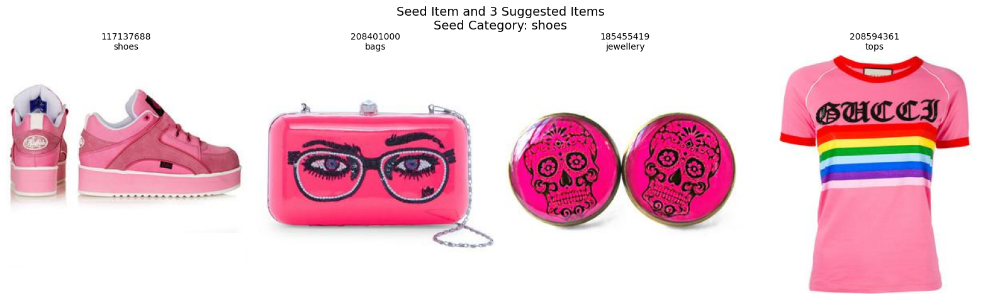

In [24]:
import json
import os
from PIL import Image
import matplotlib.pyplot as plt

# -----------------------------
# Load JSON mapping
# -----------------------------
json_path = '/content/full_item_outfit_mapping_faiss.json'
with open(json_path, 'r') as f:
    outfit_mapping = json.load(f)

print(f"Loaded outfit mapping for {len(outfit_mapping)} items.\n")

# -----------------------------
# Helper: get metadata info
# -----------------------------
def get_item_info(item_id, metadata):
    item_meta = metadata.get(item_id, {})
    title = item_meta.get('title', '')
    description = item_meta.get('description', '')
    semantic_category = item_meta.get('semantic_category', '')
    return title, description, semantic_category

# Load metadata again
with open('/content/polyvore-outfit-dataset/polyvore_outfits/polyvore_item_metadata.json','r') as f:
    metadata = json.load(f)

# -----------------------------
# Pick a seed to check
# -----------------------------
seed_item_id = list(outfit_mapping.keys())[0]  # chọn 1 seed ngẫu nhiên
suggested_ids = outfit_mapping[seed_item_id]

# Print JSON content for this seed
print("Seed Item ID:", seed_item_id)
print("Suggested Items:", suggested_ids)

seed_title, seed_desc, seed_semantic = get_item_info(seed_item_id, metadata)
print(f"\nSeed Metadata: Title: {seed_title}, Category: {seed_semantic}, Description: {seed_desc}")

print("\nSuggested Items Metadata:")
for i, item_id in enumerate(suggested_ids):
    title, desc, sem_cat = get_item_info(item_id, metadata)
    print(f"{i+1}. ID: {item_id}, Category: {sem_cat}, Title: {title}, Description: {desc}")

# -----------------------------
# Visualize images
# -----------------------------
all_ids = [seed_item_id] + suggested_ids
num_cols = 4
plt.figure(figsize=(num_cols*4, 5))

for idx, item_id in enumerate(all_ids):
    img_path = f"/content/polyvore-outfit-dataset/polyvore_outfits/images/{item_id}.jpg"
    plt.subplot(1,num_cols,idx+1)
    if os.path.exists(img_path):
        img = Image.open(img_path).convert('RGB')
        plt.imshow(img)
        title, desc, sem_cat = get_item_info(item_id, metadata)
        plt.title(f"{item_id}\n{sem_cat}", fontsize=10)
    else:
        plt.text(0.5,0.5,"Image not found", ha='center', va='center')
    plt.axis('off')

plt.suptitle(f'Seed Item and 3 Suggested Items\nSeed Category: {seed_semantic}', fontsize=14)
plt.tight_layout()
plt.show()
